In [1]:
import cogsworth
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import astropy.units as u

In [2]:
# this all just makes plots look nice
%config InlineBackend.figure_format = 'retina'

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)
pd.options.display.max_columns = 999

Let's sample the same number of stars from each class with the exact same parameters and compare

In [3]:
burst = cogsworth.sfh.BurstUniformDisc(100000, t_burst=5*u.Gyr, z_max=3*u.kpc, R_max=15*u.kpc, Z_all=0.02)
constant = cogsworth.sfh.ConstantUniformDisc(100000, t_burst=5*u.Gyr, z_max=3*u.kpc, R_max=15*u.kpc, Z_all=0.02)

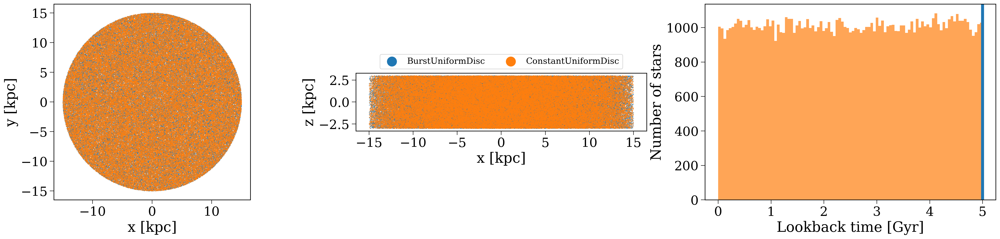

In [4]:
fig, ax = plt.subplots(1, 3, figsize=(30, 6))

ax[0].scatter(burst.x, burst.y, s=0.1, color='C0', label='BurstUniformDisc')
ax[0].scatter(constant.x, constant.y, s=0.1, color='C1', label='ConstantUniformDisc')
ax[0].set_xlabel('x [kpc]')
ax[0].set_ylabel('y [kpc]')
ax[0].set_aspect('equal')

ax[1].scatter(burst.x, burst.z, s=0.1, color='C0', label='BurstUniformDisc')
ax[1].scatter(constant.x, constant.z, s=0.1, color='C1', label='ConstantUniformDisc')
ax[1].set_xlabel('x [kpc]')
ax[1].set_ylabel('z [kpc]')
ax[1].set_aspect('equal')

ax[2].axvline(5, color='C0', lw=5)
ax[2].hist(constant.tau.to(u.Gyr).value, bins=np.linspace(0, 5, 100), alpha=0.7, color='C1', label='ConstantUniformDisc')
ax[2].set_xlabel('Lookback time [Gyr]')
ax[2].set_ylabel('Number of stars')

ax[1].legend(markerscale=50, fontsize=0.6 * fs, loc='lower center', bbox_to_anchor=(0.5, 1.0), ncol=2)

Spatially the distributions are identical, the difference is only in the lookback time plot.

In [5]:
class LinearMetallicityDisc(cogsworth.sfh.ConstantUniformDisc):
    def get_metallicity(self):
        """Linearly increasing metallicity with radius, starts at 0, solar at 8 kpc"""
        self._Z = self.rho.to(u.kpc).value * 0.02 / 8 * u.dimensionless_unscaled
        return self._Z

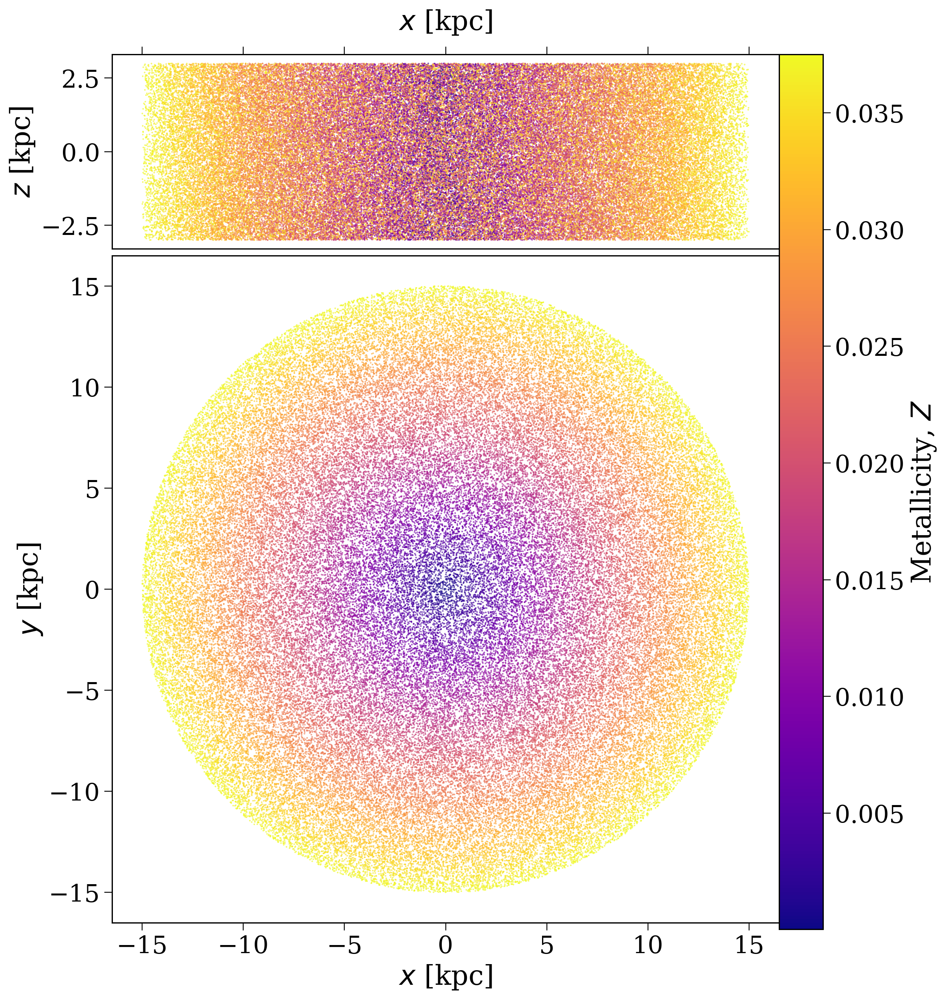

(<Figure size 1247.5x1400 with 3 Axes>,
 array([<Axes: xlabel='$x$ [kpc]', ylabel='$z$ [kpc]'>,
        <Axes: xlabel='$x$ [kpc]', ylabel='$y$ [kpc]'>], dtype=object))

In [6]:
disc = LinearMetallicityDisc(100000, t_burst=5*u.Gyr, z_max=3*u.kpc, R_max=15*u.kpc)
disc.plot(cbar_norm=None)

I'll leave it as an exercise to you to consider how you could modify it to depend on the age as well!

It looks much like a normal star formation history call but now we also provide a Plummer mass of $10^{10} M_\odot$ and a scale radius of 5 kpc.

In [7]:
plummer = cogsworth.sfh.ConstantPlummerSphere(
    size=100000, 
    tau_min=0*u.Gyr, 
    tau_max=10*u.Gyr, 
    Z_all=0.02,
    M=1e10*u.Msun,
    a=5.0*u.kpc,
)

Now let's make those same plots as earlier.

Text(0, 0.5, 'Number of stars')

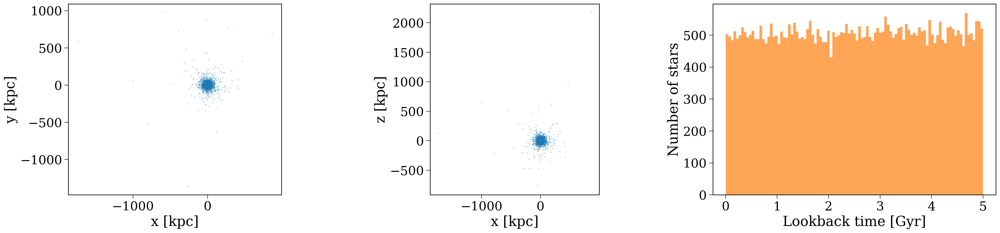

In [8]:
fig, ax = plt.subplots(1, 3, figsize=(30, 6))

ax[0].scatter(plummer.x, plummer.y, s=0.1, color='C0', label='BurstUniformDisc')
ax[0].set_xlabel('x [kpc]')
ax[0].set_ylabel('y [kpc]')
ax[0].set_aspect('equal')

ax[1].scatter(plummer.x, plummer.z, s=0.1, color='C0', label='BurstUniformDisc')
ax[1].set_xlabel('x [kpc]')
ax[1].set_ylabel('z [kpc]')
ax[1].set_aspect('equal')

ax[2].hist(plummer.tau.to(u.Gyr).value, bins=np.linspace(0, 5, 100), alpha=0.7, color='C1', label='ConstantUniformDisc')
ax[2].set_xlabel('Lookback time [Gyr]')
ax[2].set_ylabel('Number of stars')

In [9]:
plummer_trunc = cogsworth.sfh.ConstantPlummerSphere(
    size=100000, 
    tau_min=0*u.Gyr, 
    tau_max=10*u.Gyr, 
    Z_all=0.02,
    M=1e10*u.Msun,
    a=5.0*u.kpc,
    r_trunc=30*u.kpc        # <-- THIS IS THE CHANGE
)

Text(0, 0.5, 'Number of stars')

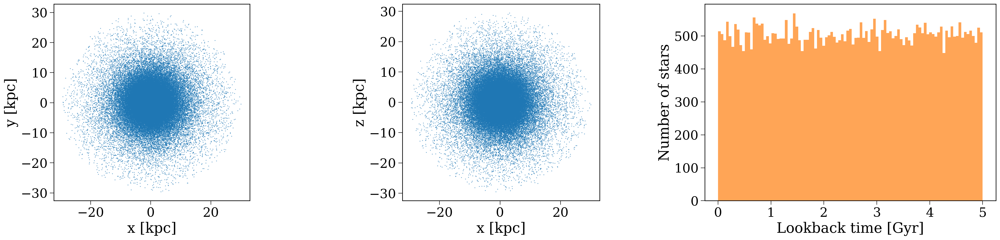

In [10]:
fig, ax = plt.subplots(1, 3, figsize=(30, 6))

ax[0].scatter(plummer_trunc.x, plummer_trunc.y, s=0.1, color='C0', label='BurstUniformDisc')
ax[0].set_xlabel('x [kpc]')
ax[0].set_ylabel('y [kpc]')
ax[0].set_aspect('equal')

ax[1].scatter(plummer_trunc.x, plummer_trunc.z, s=0.1, color='C0', label='BurstUniformDisc')
ax[1].set_xlabel('x [kpc]')
ax[1].set_ylabel('z [kpc]')
ax[1].set_aspect('equal')

ax[2].hist(plummer_trunc.tau.to(u.Gyr).value, bins=np.linspace(0, 5, 100), alpha=0.7, color='C1', label='ConstantUniformDisc')
ax[2].set_xlabel('Lookback time [Gyr]')
ax[2].set_ylabel('Number of stars')

In [11]:
class LinearZTimePlummer(cogsworth.sfh.ConstantPlummerSphere):
    def __init__(self, Z_min=0, Z_scale=0.0025, **kwargs):
        self.Z_min = Z_min
        self.Z_scale = Z_scale
        super().__init__(**kwargs)

    def get_metallicity(self):
        """Linearly increasing metallicity with time"""
        self._Z = (self.Z_min + self.Z_scale * (self.tau.to(u.Gyr).value)) * u.dimensionless_unscaled
        return self._Z

In [12]:
plummer_Z = LinearZTimePlummer(
    size=100000, 
    tau_min=0*u.Gyr, 
    tau_max=10*u.Gyr,
    Z_all=None,
    Z_min=0.0,
    Z_scale=0.0005,
    M=1e10*u.Msun,
    a=5.0*u.kpc,
    r_trunc=30*u.kpc
)

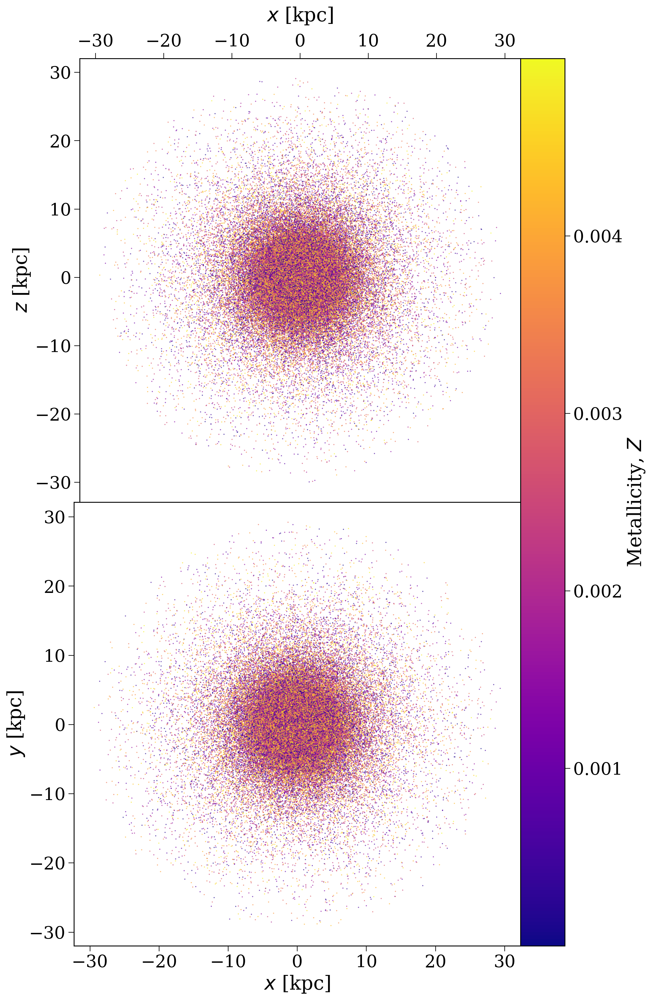

In [13]:
fig, axes = plt.subplots(2, 1, figsize=(12, 20))
fig, axes = plummer_Z.plot(cbar_norm=None, fig=fig, axes=axes, show=False)
for ax in axes:
    ax.set_aspect('equal')